<a href="https://colab.research.google.com/github/Pvnsraviteja/Detectron2/blob/main/Detectron2_drive_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [How to train Detectron2 with Custom COCO Datasets](https://www.dlology.com/blog/how-to-train-detectron2-with-custom-coco-datasets/) | DLology

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This notebook will help you get started with this framwork by training a instance segmentation model with your custom COCO datasets.

# Install detectron2

In [1]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-wxxks0ka
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-wxxks0ka
     |████████████████████████████████| 636 kB 28.4 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-py3-none-any.whl size=64498 sha256=f73d1fcf22f14f5c29562fc0db6a41b2caf2bd4994cb6dc41d2665b61b977900
  Stored in directory: /tmp/pip-ephem-wheel-cache-t2431sye/wheels/24/1d/09/8167de727fe5b74f832b6fcb5d9069d8f03ca29f337bfe484d
Successfully built fvcore
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


'1.9.0+cu102'

In [2]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 12640, done.
remote: Counting objects: 100% (138/138), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 12640 (delta 51), reused 101 (delta 45), pack-reused 12502
Receiving objects: 100% (12640/12640), 5.40 MiB | 22.84 MiB/s, done.
Resolving deltas: 100% (8999/8999), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 74 kB 3.2 MB/s 
     |████████████████████████████████| 144 kB 61.0 MB/s 
     |████████████████████████████████| 130 kB 65.4 MB/s 
     |████████████████████████████████| 743 kB 52.1 MB/s 
     |████████████████████████████████| 721 kB 53.1 MB/s 
     |████████████████████████████████| 112 kB 65.4 MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-py3-none-any.whl size=141229 sha256=78d37de388ede3c224a91d8aec45d47b4478d9f0b5e67a323482ba3c522091bc
  Stored in directory: /root/.cache/pip/wheels/ca/33/b7/336836125fc9bb4cea

In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom COCO dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the fruits nuts segmentation dataset](https://github.com/Tony607/mmdetection_instance_segmentation_demo)
which only has 3 classes: data, fig, and hazelnut.
We'll train a segmentation model from an existing model pre-trained on the COCO dataset, available in detectron2's model zoo.

Note that the COCO dataset does not have the "data", "fig" and "hazelnut" categories.

In [2]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("steel_dataset_train", {}, "./train/train.json", "./train")
register_coco_instances("steel_dataset_val", {}, "./valid/valid.json", "./valid")
register_coco_instances("steel_dataset_test", {}, "./test/test.json", "./test")

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



WARNING [07/27 10:30:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/27 10:30:56 d2.data.datasets.coco]: Loaded 103 images in COCO format from ./train/train.json


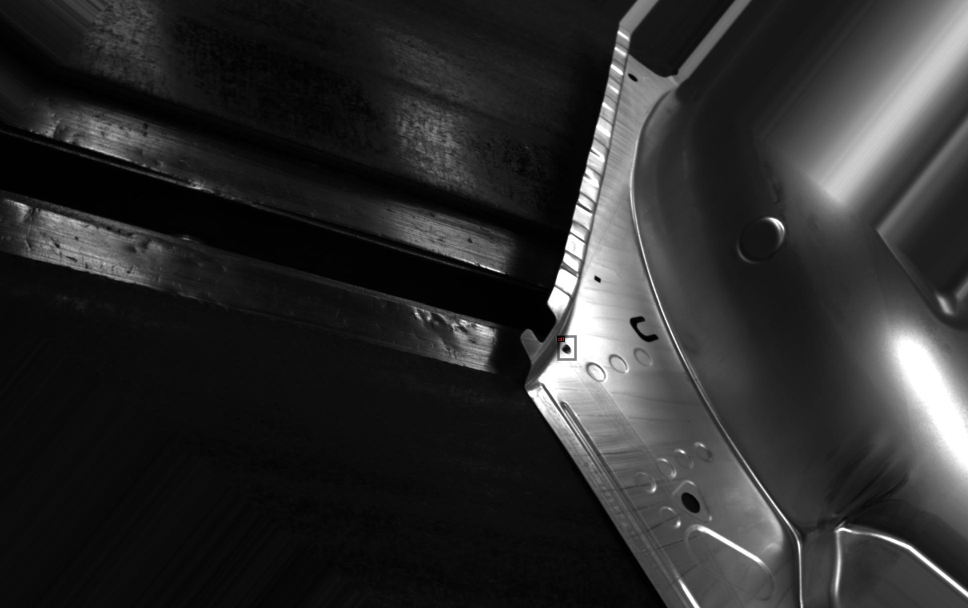

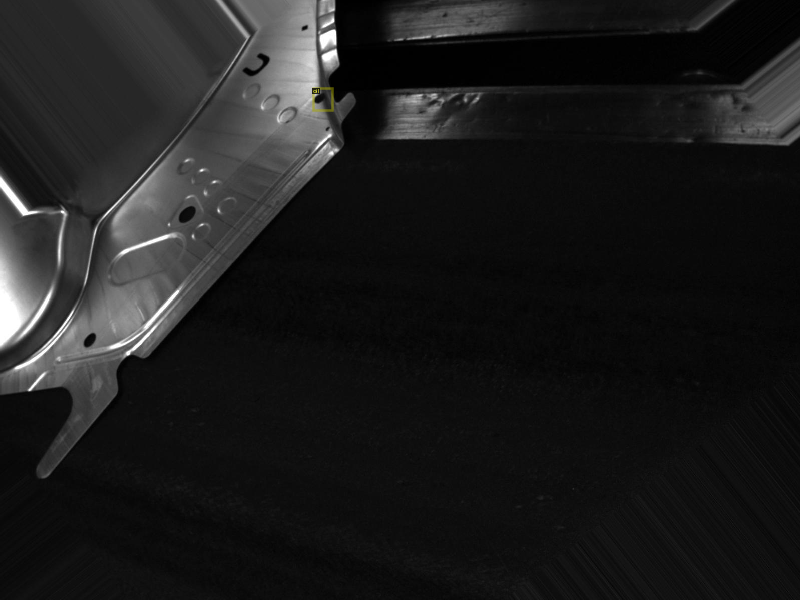

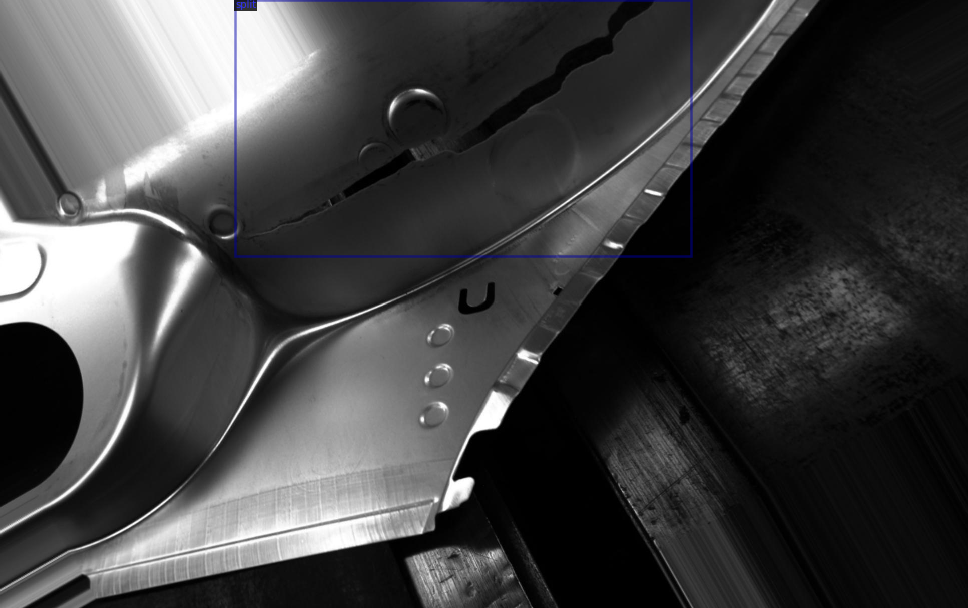

In [3]:
my_dataset_train_metadata = MetadataCatalog.get("steel_dataset_train")
dataset_dicts = DatasetCatalog.get("steel_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the steel dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU.


In [4]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml"))
cfg.DATASETS.TRAIN = ("steel_dataset_train",)
cfg.DATASETS.TEST = ("steel_dataset_val",)   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_C4_3x.yaml" ) # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 1000  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE =128  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # 3 classes (data, fig, hazelnut)
cfg.TEST.EVAL_PERIOD = 500

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/27 10:31:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_298dad.pkl: 212MB [00:05, 36.8MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 2048) in the checkpoint but (4, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 2048) in the checkpoint but (12, 2048) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (12,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_p

[07/27 10:31:29 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


[07/27 10:31:45 d2.utils.events]:  eta: 0:12:08  iter: 19  total_loss: 1.367  loss_cls: 1.067  loss_box_reg: 0.1677  loss_rpn_cls: 0.2114  loss_rpn_loc: 0.049  time: 0.7508  data_time: 0.0261  lr: 4.9952e-05  max_mem: 3098M
[07/27 10:32:00 d2.utils.events]:  eta: 0:12:13  iter: 39  total_loss: 0.6885  loss_cls: 0.2483  loss_box_reg: 0.1345  loss_rpn_cls: 0.1809  loss_rpn_loc: 0.03333  time: 0.7651  data_time: 0.0115  lr: 9.9902e-05  max_mem: 3098M
[07/27 10:32:16 d2.utils.events]:  eta: 0:12:08  iter: 59  total_loss: 0.4622  loss_cls: 0.1658  loss_box_reg: 0.1297  loss_rpn_cls: 0.1379  loss_rpn_loc: 0.00818  time: 0.7737  data_time: 0.0103  lr: 0.00014985  max_mem: 3098M
[07/27 10:32:32 d2.utils.events]:  eta: 0:12:04  iter: 79  total_loss: 0.5211  loss_cls: 0.1831  loss_box_reg: 0.2066  loss_rpn_cls: 0.09844  loss_rpn_loc: 0.01641  time: 0.7815  data_time: 0.0108  lr: 0.0001998  max_mem: 3098M
[07/27 10:32:48 d2.utils.events]:  eta: 0:11:51  iter: 99  total_loss: 0.286  loss_cls: 0.13

In [5]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

Now, we perform inference with the trained model on the fruits_nuts dataset. First, let's create a predictor using the model we just trained:



In [6]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
cfg.DATASETS.TEST = ("steel_dataset_test", )
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("steel_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "steel_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [07/27 10:47:33 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [07/27 10:47:33 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/27 10:47:33 d2.data.datasets.coco]: Loaded 15 images in COCO format from ./test/test.json
[07/27 10:47:33 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   split    | 0            |    oil     | 12           |   split    | 3            |
|            |              |            |              |            |              |
|   total    | 15           |            |              |            |              |
[07/27 10:47:33 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inferen

OrderedDict([('bbox',
              {'AP': 48.87363708898362,
               'AP-oil': 34.41394084463391,
               'AP-split': 63.33333333333333,
               'AP50': 94.93526275704494,
               'AP75': 38.49009900990099,
               'APl': 63.33333333333333,
               'APm': 34.479045099420304,
               'APs': nan})])

Then, we randomly select several samples to visualize the prediction results.

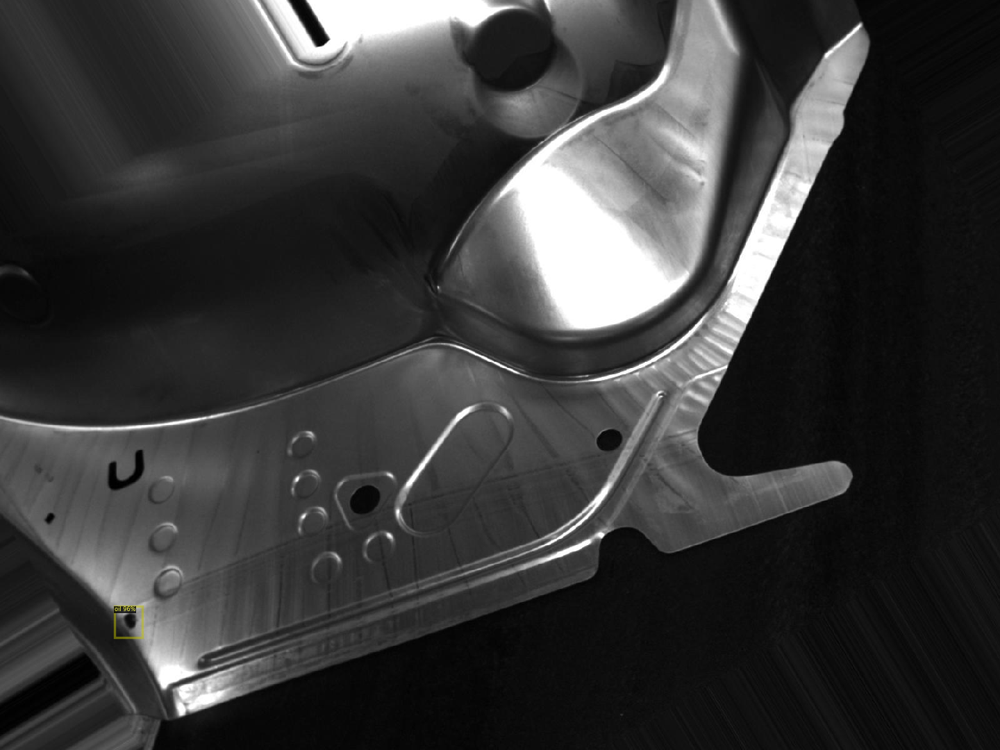

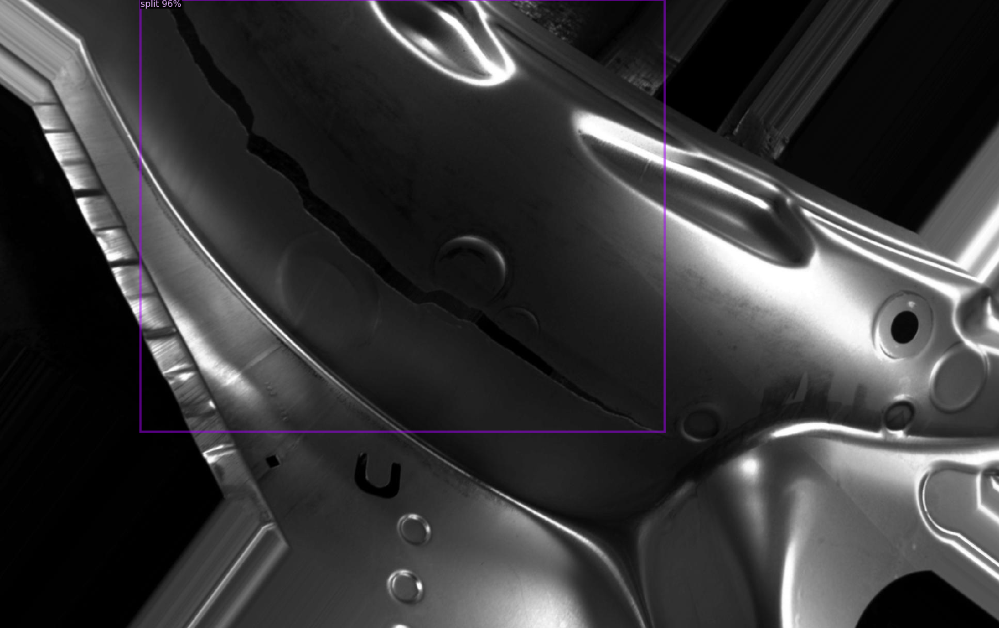

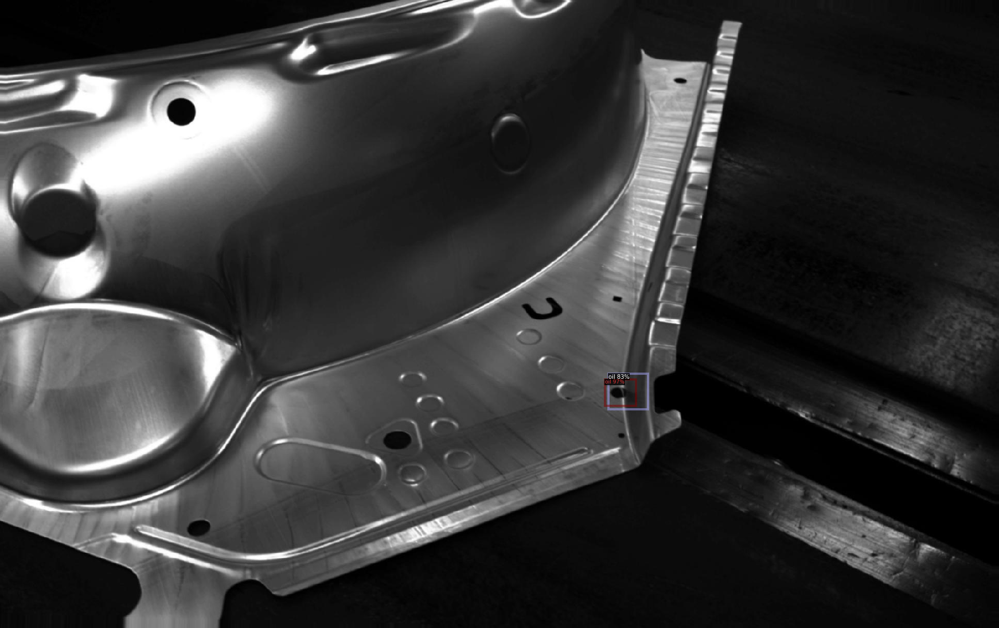

In [7]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_train_metadata, 
                   scale=0.9, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

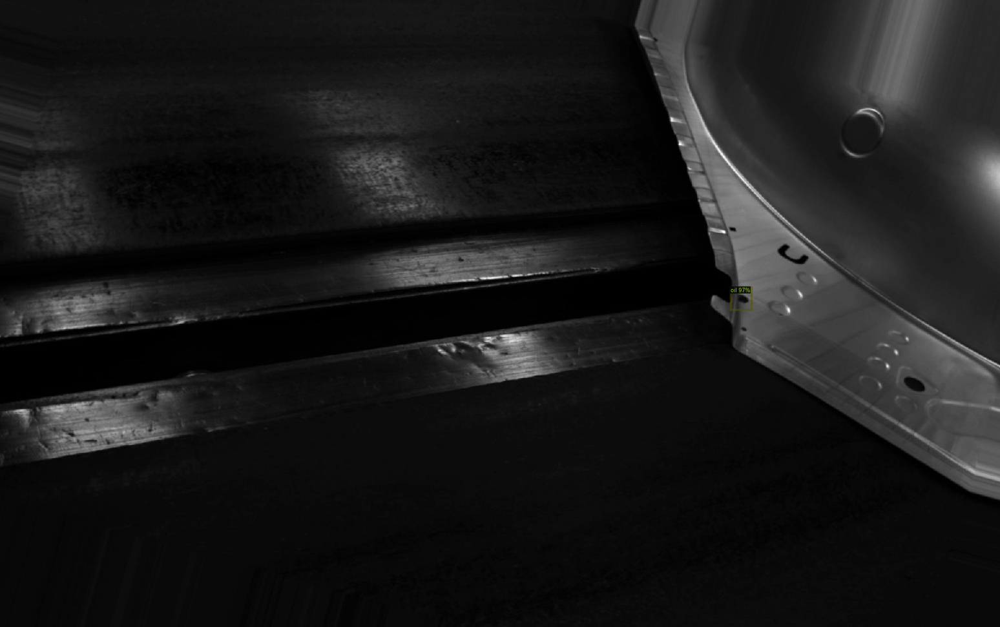

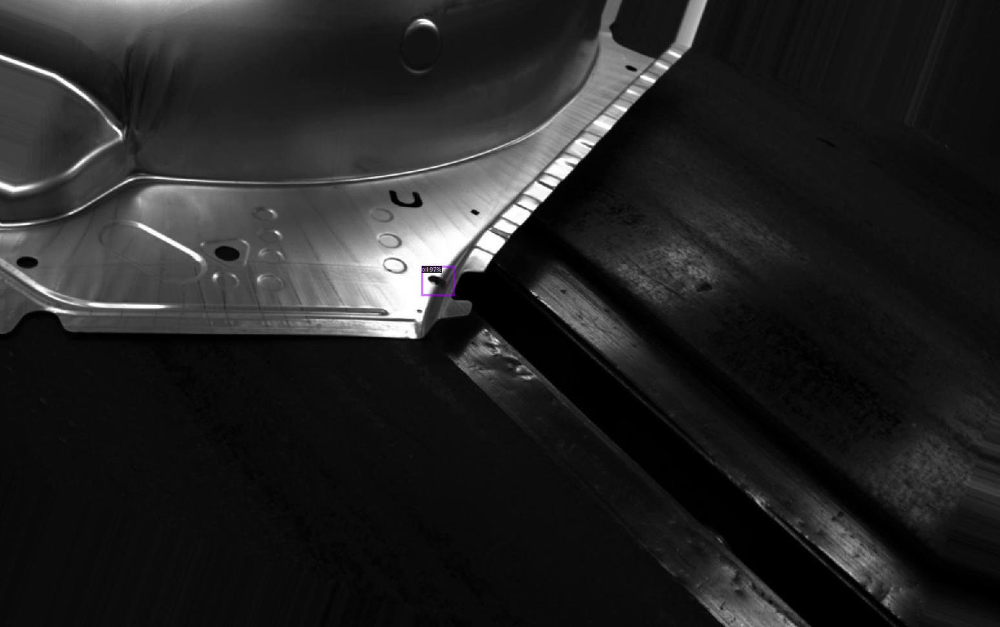

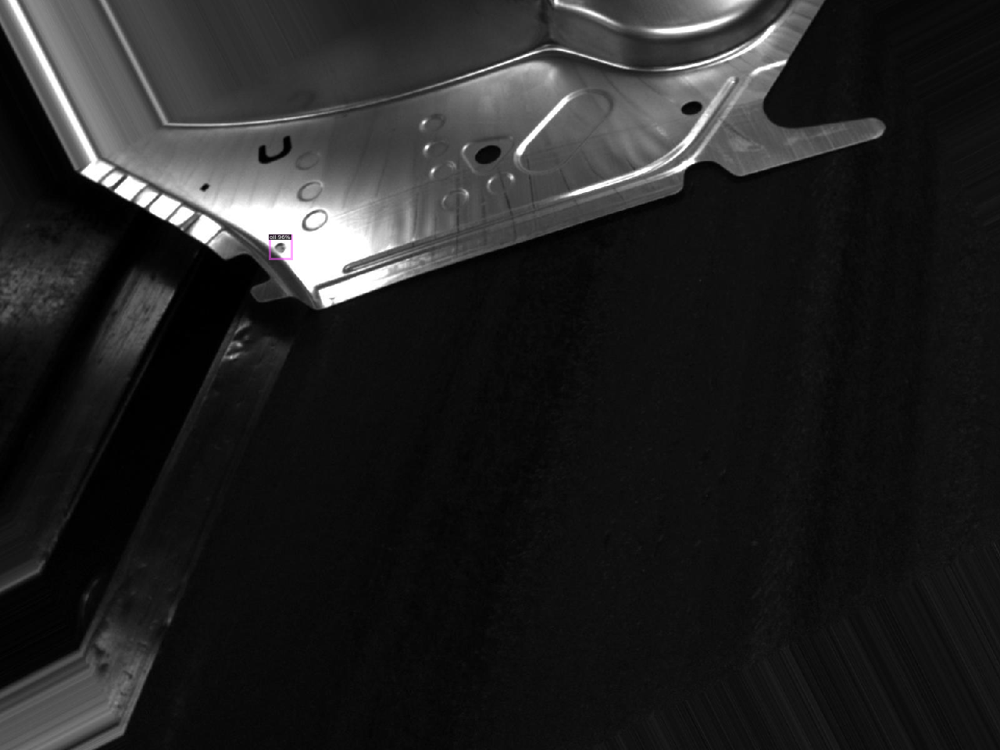

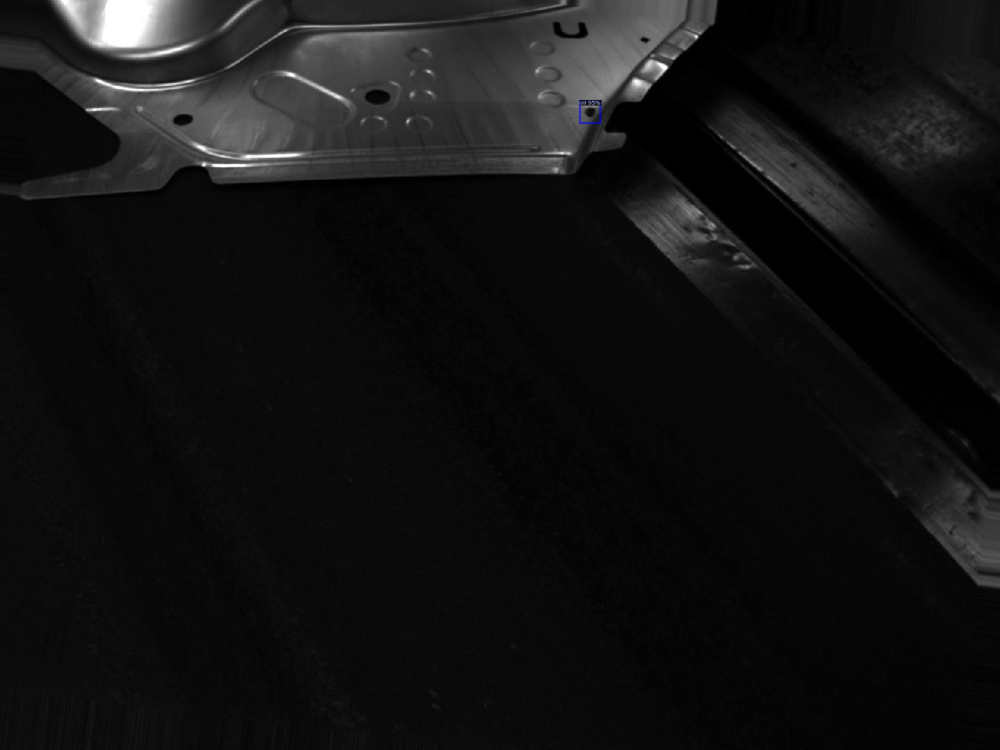

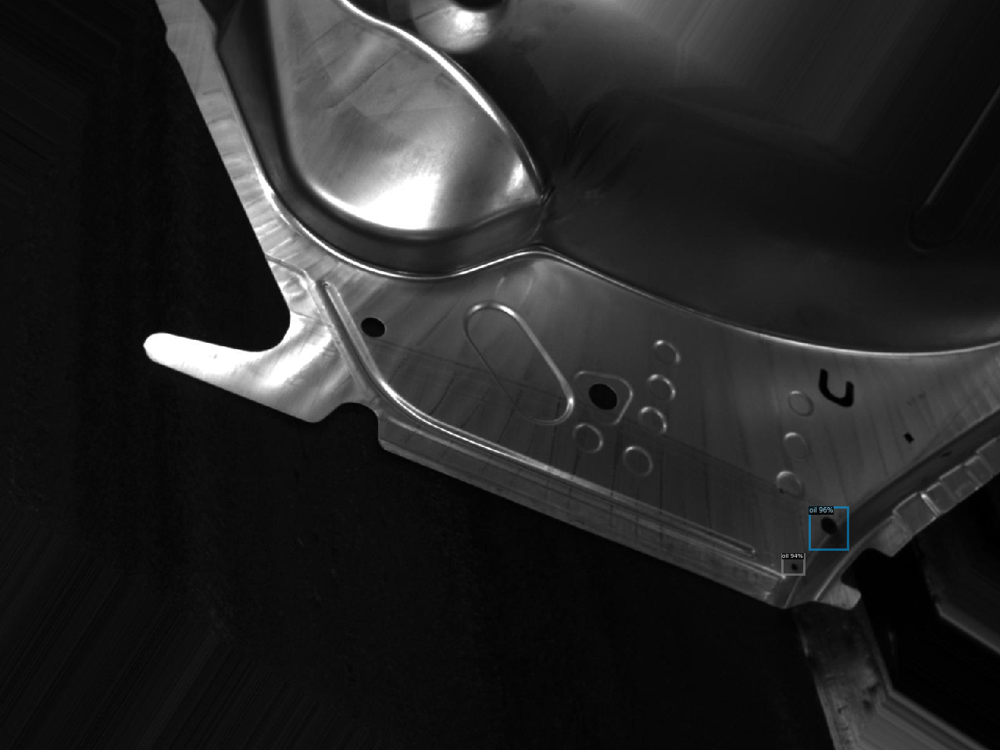

...

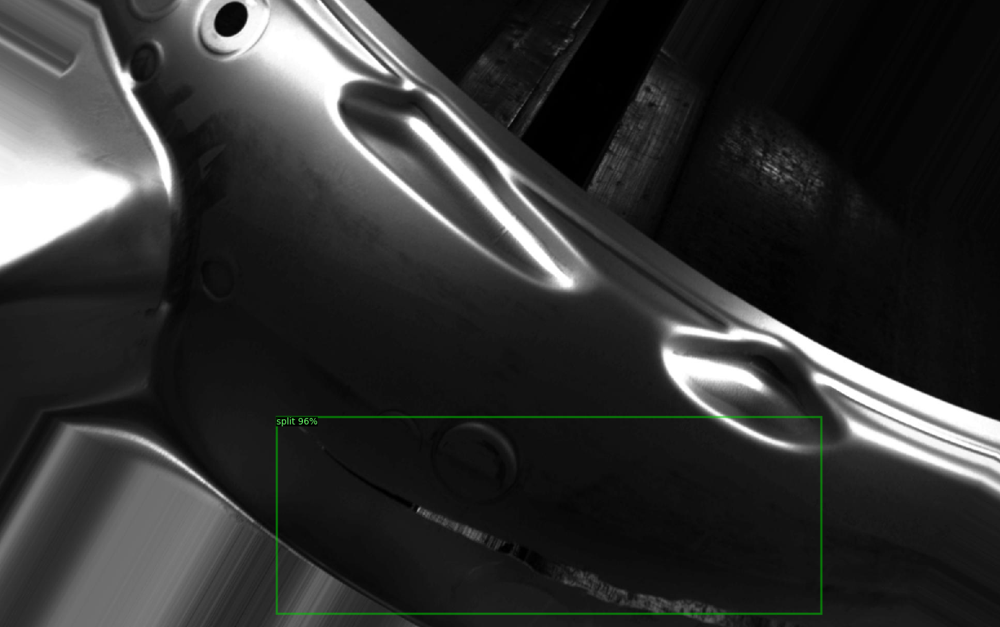

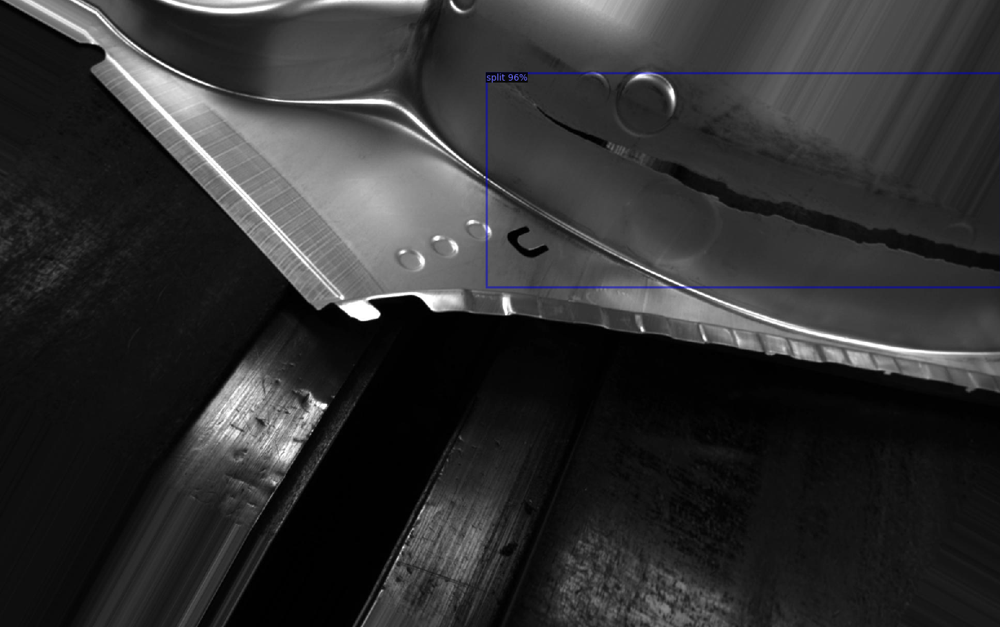

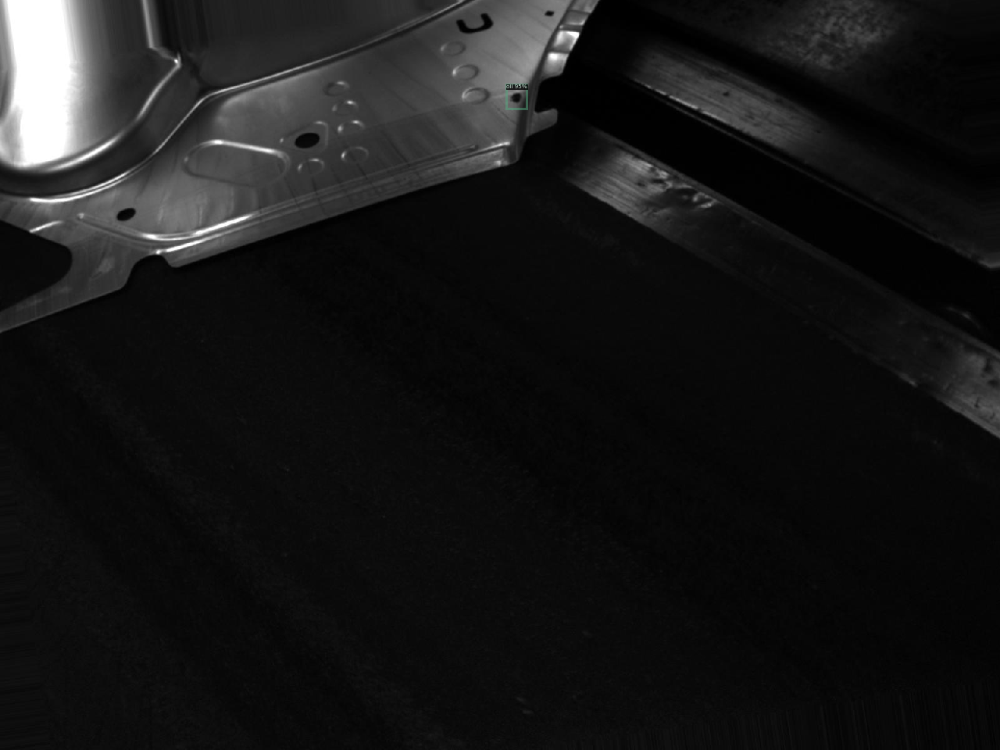

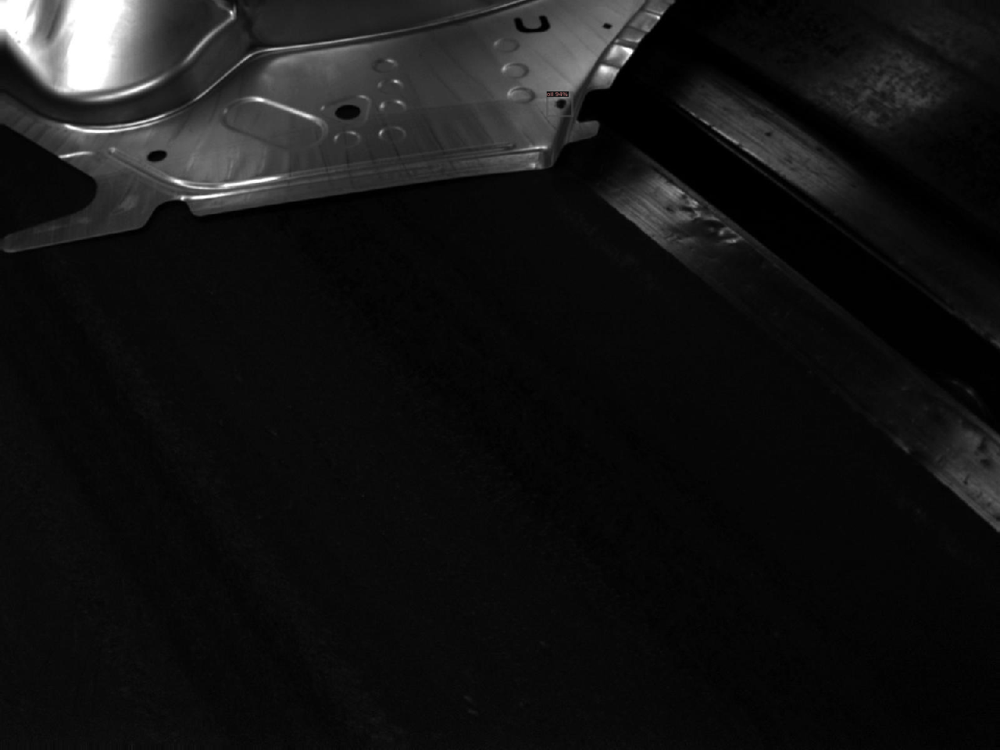

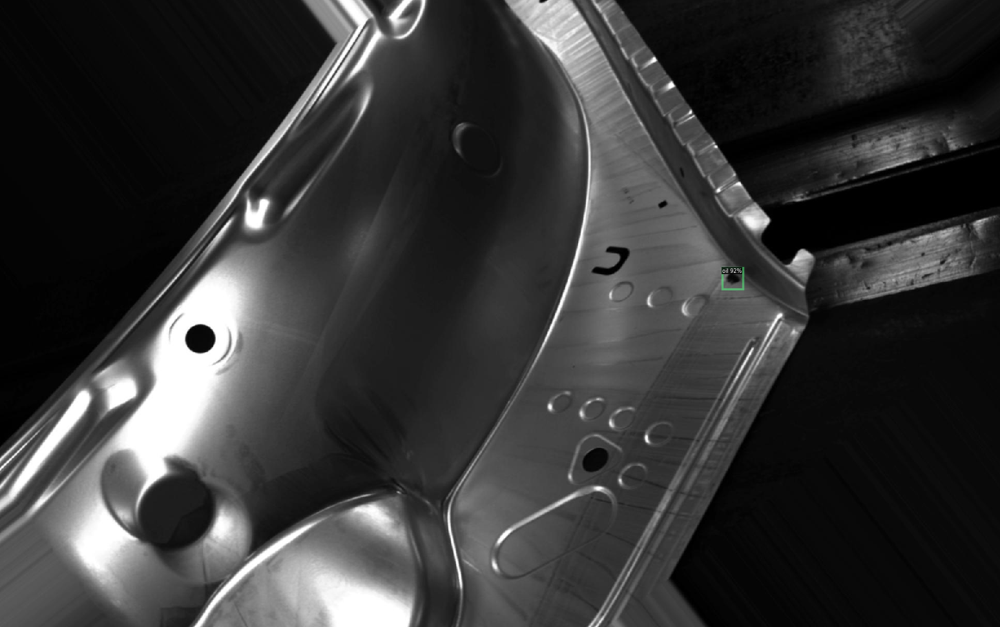

In [8]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("steel_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6  # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("steel_dataset_test")

from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('./test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [9]:
my_dataset_train_metadata

Metadata(evaluator_type='coco', image_root='./train', json_file='./train/train.json', name='steel_dataset_train', thing_classes=['split', 'oil', 'split'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

## Benchmark inference speed

In [10]:
import time
times = []
for i in range(20):
    start_time = time.time()
    outputs = predictor(im)
    delta = time.time() - start_time
    times.append(delta)
mean_delta = np.array(times).mean()
fps = 1 / mean_delta
print("Average(sec):{:.2f},fps:{:.2f}".format(mean_delta, fps))

Average(sec):0.55,fps:1.81
